In [1]:
# final project for the py3 Michigan course
# Problem statement :  we have scanned newspaper pages, given a keyword, make a sheet of all
# the faces on it ( image by image ) if that word is present on the newspaper image 

In [2]:
#lets see the newspaper image ( sample ), work on it a bit and find what we can do

In [1]:
from PIL import Image, ImageDraw
import pytesseract
from IPython.display import display

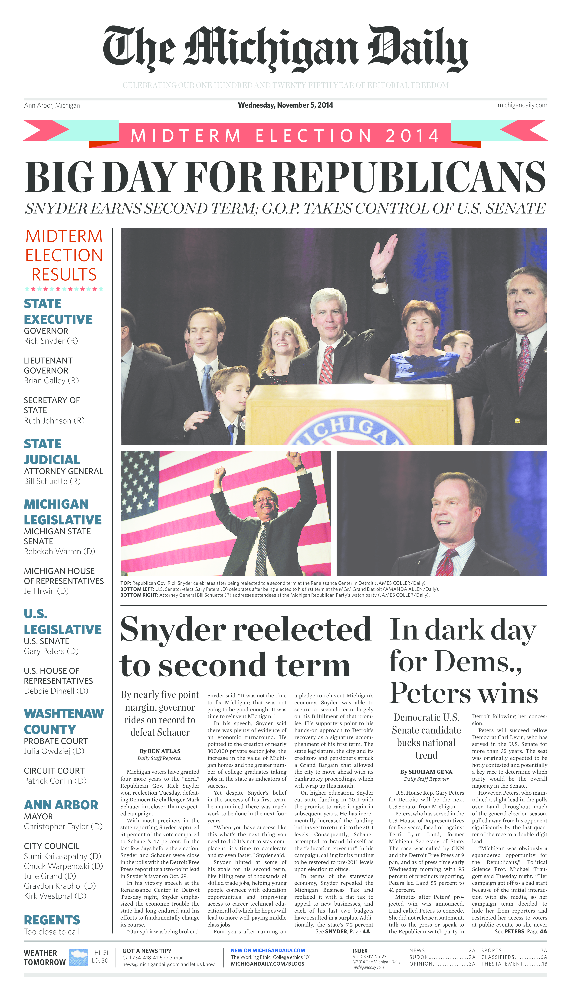

In [4]:
test1 = Image.open("small_img/a-0.png")
display(test1)

In [5]:
#ok, first thing I notice is... its a big size image: so it will take time to process

In [6]:
# lets give it to tesseract to see how it works on it
# also lets timeit using %time it

In [ ]:
text_test1 = pytesseract.image_to_string(test1)

%timeit pytesseract.image_to_string(test1)

In [ ]:
# it took a lot of time, ahhhh : i should have probably given a grayscale image
# it took roughly 14 seconds... and we will have almost 10 images - almost 3 min
# lets see if we can improve it, 
# before that lets see the text it gather from that image

print(text_test1)

In [ ]:
# as expected the text is beautiful, but it did not covered everything :  that will be a pain
# we can use kraken to make it read through columns properly ... 
#( using a black column seperator)
# but lets keep that work for later
# lets give gray scale and binarisation a try

test1_gray = test1.copy().convert('L')
display(test1_gray)

In [ ]:
text_test1_gray = pytesseract.image_to_string(test1_gray)

%timeit pytesseract.image_to_string(test1_gray)
print(text_test1_gray)

In [2]:
# ok, it took the same time 13.2 seconds : but we got more proper text
# lets try to binarize it (we can also try to reduce size and see the effect)
import numpy as np
def binarize(image, threshold):
    # 120 to 140 as threshold works good for most text ( personal experience )
    image_gray = image.convert('L')
    arr = np.asarray(image_gray)
    arr = np.where(arr > threshold, 255, 0)
    binarize_image = Image.fromarray((arr).astype(np.uint8))
    return binarize_image
    
# lets test this new function on a sample image : 2.png

In [ ]:
sample1 = Image.open("2.png")
binarize_sample1 = binarize(sample1, 130)
display(binarize_sample1)

%timeit binarize_sample1 = binarize(sample1, 130)

In [ ]:
help(np.where)

In [ ]:
# the binarize function is fast, i hope using np array i was able to reduce time (as now)
# instead of going to every pixel and seeing it, using np.where do it fast.
# lets try one last thing for today, binarize test1 and call tesseract on it. 


binarize_test1 = binarize(test1, 120)
display(binarize_test1)

In [ ]:
# binarization was fast, lets run tesseract

text_binarize_test1 = pytesseract.image_to_string(binarize_test1)

#lets also time it

%timeit pytesseract.image_to_string(binarize_test1)

# and print the result 
print(text_binarize_test1)

In [ ]:
# 12 seconds, it got the text but still it missed few spots
# for today its done, for tom we can try few things

# 1. resize the image, binarize it and feed to tesseract 
# 2. try different threshold value 
# date - 28 july, 2020

In [ ]:
# day - 2 ( 29 july, 2020)
help(Image.Image.resize)

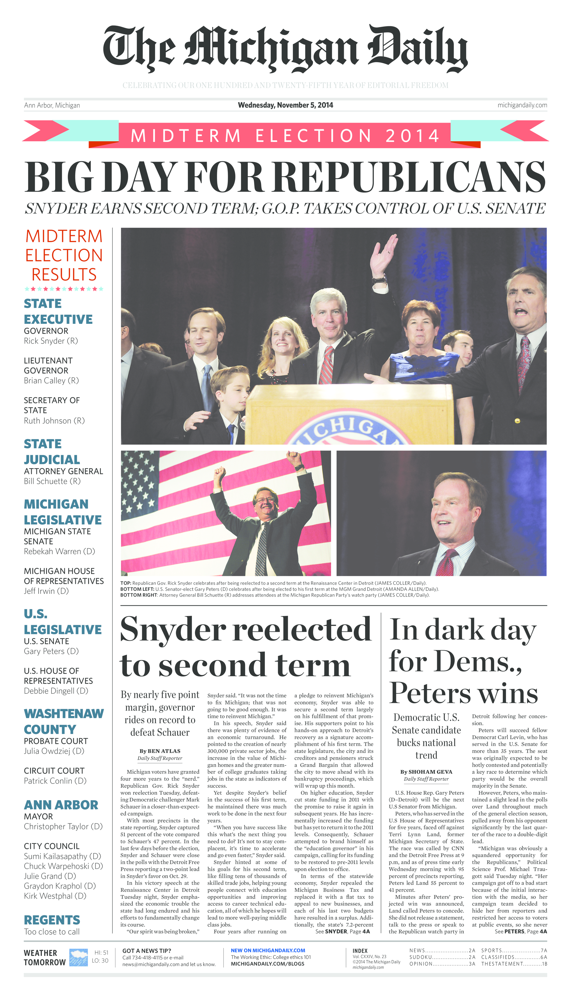

In [3]:
test2 = Image.open("small_img/a-0.png")
test2_small = test2.resize((test2.width//2, test2.height//2))
display(test2_small)

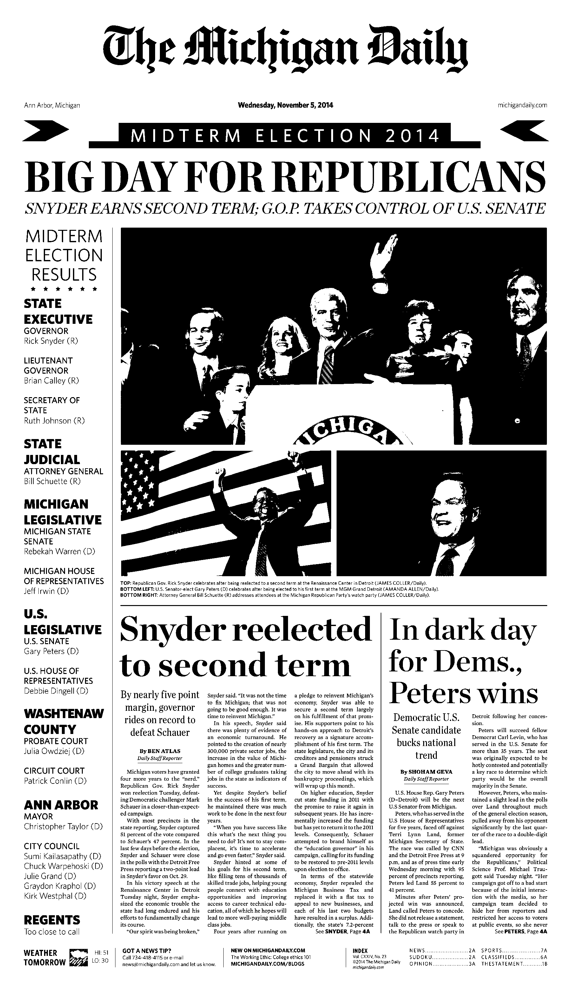

In [4]:
# we reduced the size by 2, lets binarize it and give it to resseract

test2_small_binarize = binarize(test2_small, 190)
display(test2_small_binarize)

In [5]:
# lets give it to tesseract, and time it too

text_test2_small_binarize = pytesseract.image_to_string(test2_small_binarize)

%timeit pytesseract.image_to_string(test2_small_binarize)

text_test2_small_binarize

7.05 s ± 347 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


"Che Michigan Daily\n\nWednesday, November 5, 2014\n\nMIDTERM ELECTION 2014\n\nAnn Arbor, Michigan\n\n>\n\n \n\nmichigandaily.com\n\n~ <\n\nBIG DAY FOR REPUBLICANS\n\nSNYDER EARNS SECOND TERM; G.O.P. TAKES CONTROL OF U.S. SENATE\n\nMIDTERM\nELECTION\nRESULTS\n\n* ke oh we koe\n\nSTATE\n\nEXECUTIVE\nGOVERNOR\nRick Snyder (R)\n\nLIEUTENANT\nGOVERNOR\nBrian Calley (R)\n\nSECRETARY OF\nSTATE\nRuth Johnson (R)\n\nSTATE\n\nJUDICIAL\nATTORNEY GENERAL\nBill Schuette CR)\n\nMICHIGAN\n\nLEGISLATIVE\nMICHIGAN STATE\nSENATE\n\nRebekah Warren (D)\n\nMICHIGAN HOUSE\nOF REPRESENTATIVES\nJeff Irwin (D)\n\nU.S.\n\nLEGISLATIVE\nU.S. SENATE\nGary Peters (D)\n\nU.S. HOUSE OF\nREPRESENTATIVES\nDebbie Dingell (D)\n\nWASHTENAW\n\nCOUNTY\nPROBATE COURT\nJulia Owdziej (D)\n\nCIRCUIT COURT\nPatrick Conlin (D)\n\nANN ARBOR\nMAYOR\nChristopher Taylor (D)\n\nCITY COUNCIL\n\nSumi Kailasapathy (D)\nChuck Warpehoski (D)\nJulie Grand (D)\nGraydon Kraphol (D)\nKirk Westphal (D)\n\nREGENTS\n\nToo close to call\n\nWEATHE

In [6]:
#as expected it took less time, and we got text 
# Now we want to nice way to get the keyword in the text
# lets hope there is a library or so ... 

# How to use find() 
'''
word = pytesseract.image_to_string(image)

if (word.find('KEYWORD') != -1): 
    print ("Contains given keyword ") 
else: 
    print ("Doesn't contains given keyword")    
'''

#lets give this a try, and also time it

word = text_test2_small_binarize
if (word.find('Julie Grand') != -1): 
    print ("Contains given keyword ") 
else: 
    print ("Doesn't contains given keyword")
    
%timeit word.find('faster')

Contains given keyword 
2.35 µs ± 8.03 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [7]:
# great, it was fast... very very fast and easy ( thanks to python BIFs )
# now lets bring in opencv face recognizesation

In [8]:
import cv2 as cv

In [9]:
face_cascade = cv.CascadeClassifier("small_img/haarcascade_frontalface_default.xml")

In [19]:
test2_cv = cv.imread("small_img/a-0.png")
test2_cv_gray = cv.cvtColor(test2_cv, cv.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(test2_cv_gray, 1.35)
faces

array([[3139, 1721,  292,  292],
       [1974, 1887,  206,  206],
       [2554, 1962,  191,  191],
       [1147, 1995,  221,  221],
       [1676, 2020,  215,  215],
       [2670, 3058,  283,  283]], dtype=int32)

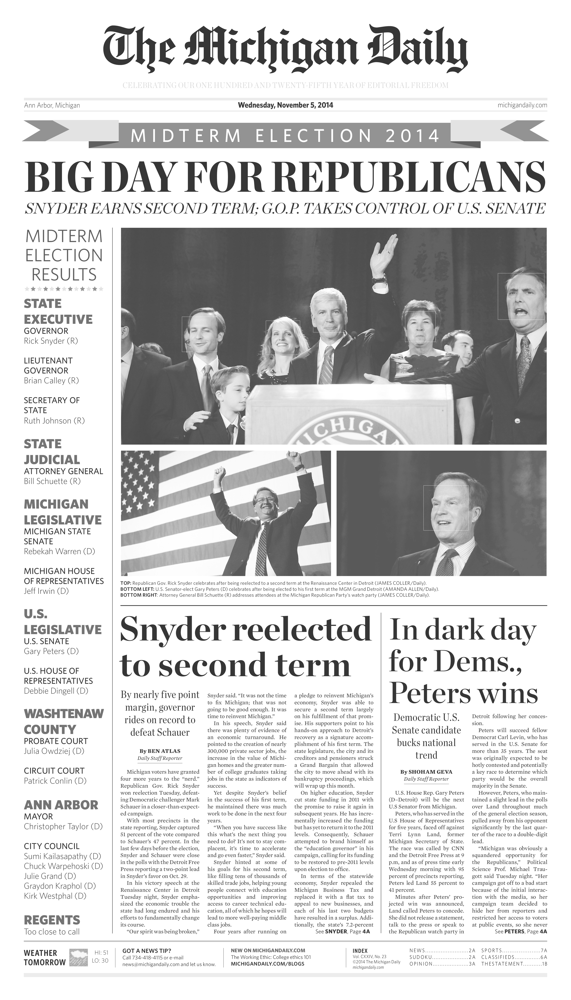

In [20]:
test2_pil = Image.fromarray(test2_cv_gray, mode='L')
test2_drawing = ImageDraw.Draw(test2_pil)
boxes = faces.tolist()

for box in boxes:
    test2_drawing.rectangle((box[0], box[1], box[0]+box[2], box[3]+box[1]), outline='white')
    
display(test2_pil)


In [12]:
# great, faces are detected nicely... lets try to tune it up using cv binarisation and other 
# parameters

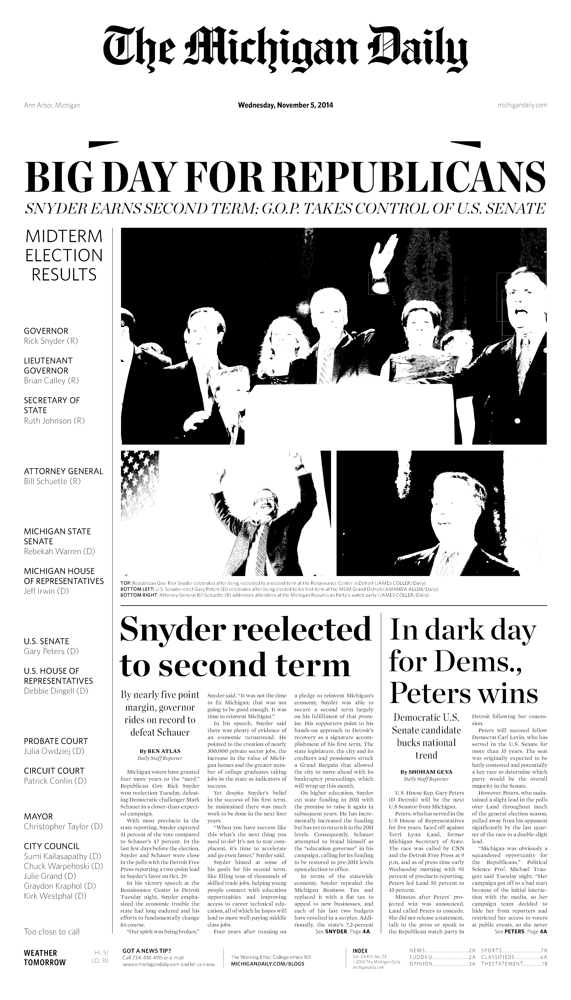

In [13]:
test2_cv_binarize = cv.threshold(test2_cv_gray,100,255,cv.THRESH_BINARY)[1]
faces = face_cascade.detectMultiScale(test2_cv_binarize)

test2_pil_binarize = Image.fromarray(test2_cv_binarize, mode='L')
test2_drawing_binarize = ImageDraw.Draw(test2_pil_binarize)
boxes = faces.tolist()

for box in boxes:
    test2_drawing_binarize.rectangle((box[0], box[1], box[0]+box[2], box[3]+box[1]), outline='white')
    
display(test2_pil_binarize)


In [21]:
# ok, for face detection binarizesation is not useful...
# now lets try to crop the images

def crop_image(image, boxes):
    images = []
    for box in boxes:
        images.append(image.crop((box[0], box[1], box[0]+box[2], box[3]+box[1])))
        
    for i in images:
        display(i)
    return images

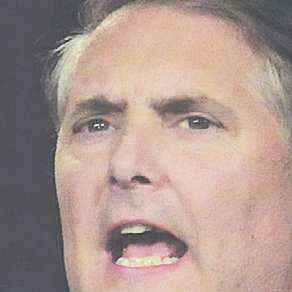

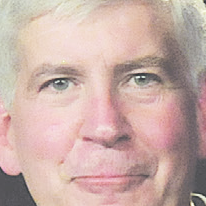

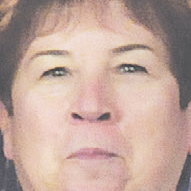

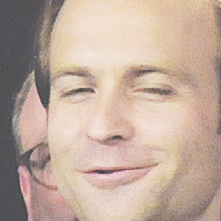

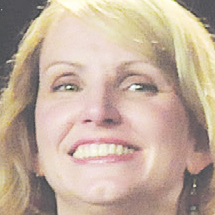

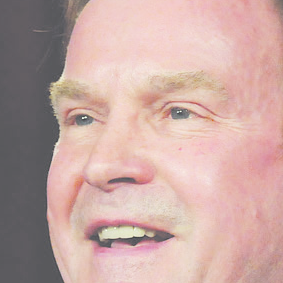

In [22]:
face_list = crop_image(test2, boxes)

In [23]:
# ok, so hyper parameter = 1.35 gives the best result
# now lets see how we can make a contact list


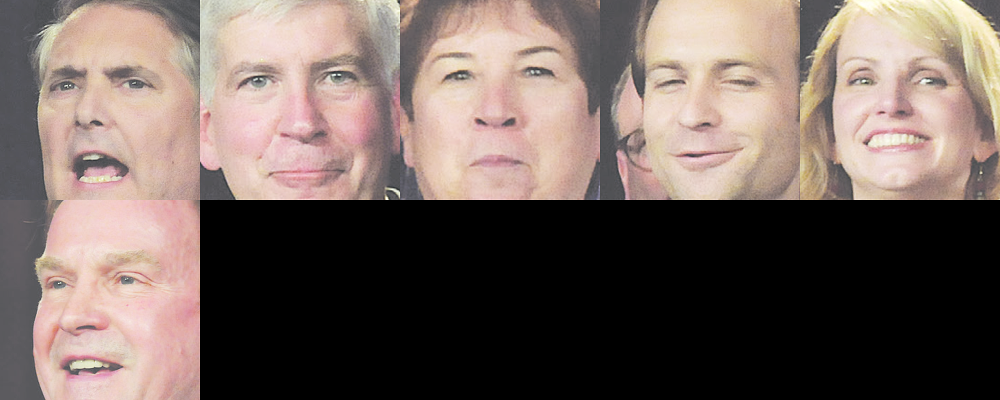

In [24]:
import math
refer_image = face_list[0]
contact_list = Image.new(refer_image.mode, (400*5, 400 * math.ceil(len(face_list)/5)))

x = 0
y = 0

for img in face_list:
    img = img.resize((400, 400))
    contact_list.paste(img, (x, y))
    
    if x + 400 == 400 * 5:
        x=0
        y = y + 400
    else:
        x = x + 400
        
display(contact_list)

In [25]:
# perfect, now we can decide the flow and make all the nescessary functions :) 


'''
we will read in the keyword 
image by image we will go through and check for key word
    if that image has the keyword, we will return a contact sheet and the result text
    
    else
        we will return text not found in that image
        
'''

In [7]:
from PIL import Image, ImageDraw
import cv2 as cv
import numpy as np
import pytesseract
import math
from IPython.display import display

def process_image(file_path,keyword):
    
    def binarise(image, threshold = 135):
        arr = np.asarray(image)
        arr = np.where(arr > threshold, 255, 0)
        binarise_image = Image.fromarray((arr).astype(np.uint8))
        
        return binarise_image
    
    def detect_faces(file_path):
        image_cv = cv.imread(file_path) # image for cv
        image_cv_gray = cv.cvtColor(image_cv, cv.COLOR_BGR2GRAY)
    
        faces = face_cascade.detectMultiScale(image_cv_gray, 1.35)

        if(faces != ()):
            boxes = faces.tolist()
        else:
            boxes = []
        
        return boxes
    
    def detect_text(file_path):
        image = Image.open(file_path).convert('L')
        image_pt = binarise(image.resize((image.width//2, image.height//2)))  # image for pytesseract
        text = pytesseract.image_to_string(image_pt)
        
        return text
    
    def make_contact_sheet(file_path, boxes):
        image = Image.open(file_path)
        
        def crop_image(image, boxes):
            images = []
            for box in boxes:
                images.append(image.crop((box[0], box[1], box[0]+box[2], box[3]+box[1])))
  
            return images

        images = crop_image(image, boxes)
    
        refer_image = images[0]
        contact_sheet = Image.new(refer_image.mode, (400*5, 400 * math.ceil(len(images)/5)))

        x = 0
        y = 0

        for img in images:
            img = img.resize((400, 400))
            contact_sheet.paste(img, (x, y))
    
            if x + 400 == 400 * 5:
                x=0
                y = y + 400
            
            else:
                x = x + 400
        
        return contact_sheet
            
        
        
        
    
    text = detect_text(file_path)
    
    if (text.find(keyword) != -1): 
        boxes = detect_faces(file_path)
        if(len(boxes)):
            contact_sheet_image = make_contact_sheet(file_path, boxes)
            print("\nKeyword was found in file %s"%(file_path))
            display(contact_sheet_image)
            print("\n\n")
        else:
            print("\nkeyword was found in file %s, but no faces detected"%(file_path))
            print("\n\n")
        
    else: 
        print ("\nkeyword was not found in file %s"%(file_path))
        print("\n\n")
    
    


Keyword was found


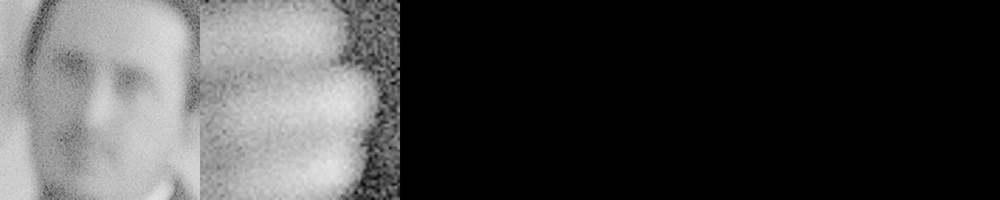

CPU times: user 24.9 s, sys: 600 ms, total: 25.5 s
Wall time: 1min 10s


In [6]:
%%time
process_image("small_img/a-3.png", "student")